In [1]:
%load_ext autoreload
%autoreload 2
exec(open('init_notebook.py').read())
from matplotlib import pyplot as plt
from highD.HighD import HighD
from highD.Filter import Filter
from highD.Plot import Plot
from highD.Visualizer import GIF
from highD.helper import *    

current working dirC:\Users\henry\Documents\CogMod-driver-behavior-model\highd_tools


In [2]:
ids = ["01"]
highD = HighD(ids, DATA_DIRECTORY)

dataset_id = 1
_, tMeta, tracks = highD.get_dataframe_tuple(dataset_id)
df = highD.get_combined_dataframe(dataset_id)
image = highD.get_image(dataset_id)

Loaded data and image for dataset 01.


In [3]:
dfs = highD.get_combined_dataframes()
images = highD.get_images()

lane_change_meta = Filter.filter_lane_change_scenario(df, buffer_frames=200)

print(lane_change_meta.shape)
lane_change_meta.head()

Filtering lane change scenario
total scenarios: 139
(139, 5)


,id,start_frame,end_frame,start_lane,end_lane
0,9,1,223,2,3
1,11,1,235,6,5
2,23,427,653,3,2
3,30,460,785,2,3
4,31,523,739,5,6


In [21]:
# select a random scenario
import numpy as np
scenario_id = np.random.randint(0, len(lane_change_meta))
print('scenario id ', scenario_id)
scenario_lane_change_meta = lane_change_meta.iloc[scenario_id]
agent_id = int(scenario_lane_change_meta['id'])
start_frame = int(scenario_lane_change_meta['start_frame'])
end_frame = int(scenario_lane_change_meta['end_frame'])
print(agent_id, start_frame, end_frame)
agent_data = df[df['id'] == agent_id]
print(agent_data.columns)

scenario id  137
1029 22218 22422
Index(['dataset_id', 'locationId', 'frame', 'id', 'class', 'drivingDirection',
       'laneId', 'x', 'y', 'width', 'height', 'xVelocity', 'yVelocity',
       'xAcceleration', 'yAcceleration', 'frontSightDistance',
       'backSightDistance', 'dhw', 'thw', 'ttc', 'precedingXVelocity',
       'precedingId', 'followingId', 'leftPrecedingId', 'leftAlongsideId',
       'leftFollowingId', 'rightPrecedingId', 'rightAlongsideId',
       'rightFollowingId', 'angle'],
      dtype='object')


agent id 1029 start: 22218, end: 22422 total frames: 204 


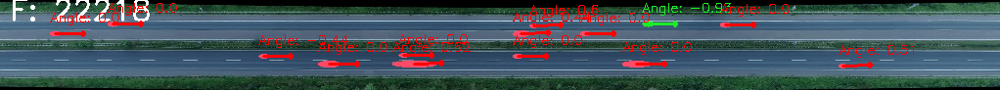

In [27]:
gif_path = GIF.create_gif_for_agent_wheel_angle(image=image,
                                    df=df,
                                    agent_id=agent_id,
                                    start_frame=start_frame,
                                    end_frame=end_frame,
                                    output_dir=OUTPUT_DIRECTORY)
display_animated_gif(gif_path)
